# Earthquakes in Turkey since February 5, 2023

This notebook first scrapes the last 500 earthquakes from Bogazici University's (BOUN) KOERI website and adds them to a dataframe of earthquakes recorded since February 5, 2023. It then uses this data to visualize earthquakes on a map using Folium library.

In [1]:
#import necessary packages
import pandas as pd
import requests
from bs4 import BeautifulSoup
import folium
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd

## Scraping the earthquakes data from web

In [2]:
# scraping function scrapes the website and saves the last 500 earthquakes in a list

def get_earthquakes():
    earthquakes = []
    response = requests.get("http://www.koeri.boun.edu.tr/scripts/lst0.asp")
    if response.status_code == 200:
        soup = BeautifulSoup(response.text, "html.parser")
        response_text = soup.pre.text
        result = response_text.split("\n")[7:-2]

        for element in result:
            earthquake_info = element.split()
            #print(earthquake_info)
            date = earthquake_info[0]
            time = earthquake_info[1]
            latitude = earthquake_info[2]
            longitude = earthquake_info[3]
            depth = earthquake_info[4]
            magnitude = earthquake_info[6]
            location = earthquake_info[8]
            city = earthquake_info[9]

            earthquake = {
                "date": date,
                "time": time,
                "latitude": latitude,
                "longitude": longitude,
                "depth": depth,
                "magnitude": magnitude,
                "location": location,
                "city": city
            }
            earthquakes.append(earthquake)

        print(f"Earthquake scan completed. Number of earthquakes: {len(earthquakes)}")

    return earthquakes

In [122]:
# call the scrape function and save the earthquakes
earthquakes_500 = get_earthquakes()

# check the first 5 records (latest occurred quakes)
earthquakes_500[0:5]

Earthquake scan completed. Number of earthquakes: 500


[{'date': '2023.03.10',
  'time': '20:51:42',
  'latitude': '38.2595',
  'longitude': '38.3433',
  'depth': '5.0',
  'magnitude': '2.9',
  'location': 'KARAGOZ-(MALATYA)',
  'city': 'Ýlksel'},
 {'date': '2023.03.10',
  'time': '20:45:24',
  'latitude': '38.4960',
  'longitude': '37.6497',
  'depth': '5.0',
  'magnitude': '2.0',
  'location': 'YESILTAS-DARENDE',
  'city': '(MALATYA)'},
 {'date': '2023.03.10',
  'time': '20:44:18',
  'latitude': '36.5200',
  'longitude': '36.2098',
  'depth': '15.6',
  'magnitude': '2.1',
  'location': 'CIRTIMAN-ISKENDERUN',
  'city': '(HATAY)'},
 {'date': '2023.03.10',
  'time': '20:39:24',
  'latitude': '38.1722',
  'longitude': '36.9987',
  'depth': '1.6',
  'magnitude': '2.4',
  'location': 'ALTAS-AFSIN',
  'city': '(KAHRAMANMARAS)'},
 {'date': '2023.03.10',
  'time': '20:37:20',
  'latitude': '38.0767',
  'longitude': '37.5123',
  'depth': '8.7',
  'magnitude': '1.8',
  'location': 'SUNNETKOY-ELBISTAN',
  'city': '(KAHRAMANMARAS)'}]

In [123]:
# print the latest 10 earthquakes in an expression:
for i,element in enumerate(earthquakes_500):
    print("On the date of",element['date'],"in", element['location'],"region an earthquake with magnitude of", element['magnitude']," occurred.")

    if i==10:
        break

On the date of 2023.03.10 in KARAGOZ-(MALATYA) region an earthquake with magnitude of 2.9  occurred.
On the date of 2023.03.10 in YESILTAS-DARENDE region an earthquake with magnitude of 2.0  occurred.
On the date of 2023.03.10 in CIRTIMAN-ISKENDERUN region an earthquake with magnitude of 2.1  occurred.
On the date of 2023.03.10 in ALTAS-AFSIN region an earthquake with magnitude of 2.4  occurred.
On the date of 2023.03.10 in SUNNETKOY-ELBISTAN region an earthquake with magnitude of 1.8  occurred.
On the date of 2023.03.10 in SAKCAGOZE-NURDAGI region an earthquake with magnitude of 2.3  occurred.
On the date of 2023.03.10 in GORGU-YESILYURT region an earthquake with magnitude of 1.7  occurred.
On the date of 2023.03.10 in KAZANDERE-GOKSUN region an earthquake with magnitude of 1.9  occurred.
On the date of 2023.03.10 in GULTEPE-KIRIKHAN region an earthquake with magnitude of 1.6  occurred.
On the date of 2023.03.10 in HALKACAYIRI-(KAHRAMANMARAS) region an earthquake with magnitude of 2.1

## Data Management

In [124]:
# convert the earthquakes list into a dataframe using Pandas library
df_500 = pd.DataFrame(earthquakes_500)
df_500.head()

,date,time,latitude,longitude,depth,magnitude,location,city
0,2023.03.10,20:51:42,38.2595,38.3433,5.0,2.9,KARAGOZ-(MALATYA),Ýlksel
1,2023.03.10,20:45:24,38.4960,37.6497,5.0,2.0,YESILTAS-DARENDE,(MALATYA)
2,2023.03.10,20:44:18,36.5200,36.2098,15.6,2.1,CIRTIMAN-ISKENDERUN,(HATAY)
3,2023.03.10,20:39:24,38.1722,36.9987,1.6,2.4,ALTAS-AFSIN,(KAHRAMANMARAS)
4,2023.03.10,20:37:20,38.0767,37.5123,8.7,1.8,SUNNETKOY-ELBISTAN,(KAHRAMANMARAS)


In [125]:
# read the csv file that contains all the earthquakes that occurred since February 5, 2023
df_old = pd.read_csv('deprems_last.csv', dtype = 'str', index_col=0)
df_old

,date,time,latitude,longitude,depth,magnitude,location,city
0,2023.03.10,00:13:11,38.6087,37.9825,5.0,1.8,TAHTALI-YAZIHAN,(MALATYA)
1,2023.03.10,00:08:47,37.1283,36.9232,7.1,4.0,ATAKOY-NURDAGI,(GAZIANTEP)
2,2023.03.10,00:01:33,40.4335,37.1697,7.2,1.4,DARIDERE-RESADIYE,(TOKAT)
3,2023.03.09,23:55:03,38.1362,37.8563,5.0,1.6,YOLKURU-DOGANSEHIR,(MALATYA)
4,2023.03.09,23:49:27,38.0723,38.7503,5.0,1.9,YESILDERE-PUTURGE,(MALATYA)
...,...,...,...,...,...,...,...,...
11803,2023.02.04,08:20:15,37.8792,32.2877,6.9,1.7,KUCUKMUHSINE-SELCUKLU,(KONYA)
11804,2023.02.04,07:56:54,40.6697,30.4580,13.0,1.0,KAYALARRESITBEY-ERENLER,(SAKARYA)
11805,2023.02.04,07:47:31,38.6232,30.7705,5.4,1.4,DEGIRMENDERE-(AFYONKARAHISAR),Ýlksel
11806,2023.02.04,07:42:02,35.8865,29.3138,13.8,1.7,AKDENIZ,Ýlksel


In [126]:
# check magnitude of the February 6th morning earthquake that struct on 4:17 am local time (it was a huge 7.8)
df_old[(df_old.date == '2023.02.06') & (df_old.time == '04:17:31')]

,date,time,latitude,longitude,depth,magnitude,location,city
11699,2023.02.06,04:17:31,37.1123,37.1195,5.0,7.8,SOFALACA-SEHITKAMIL,(GAZIANTEP)


In [127]:
# Use Concat to add the latest 500 earthquakes to the dataframe of previous quakes while dropping duplicate records, and save it to into the csv file to update records
df_updated = pd.concat([df_500,df_old], ignore_index=True).drop_duplicates().reset_index(drop=True)

df_updated.to_csv('deprems_last.csv')
df_updated


,date,time,latitude,longitude,depth,magnitude,location,city
0,2023.03.10,20:51:42,38.2595,38.3433,5.0,2.9,KARAGOZ-(MALATYA),Ýlksel
1,2023.03.10,20:45:24,38.4960,37.6497,5.0,2.0,YESILTAS-DARENDE,(MALATYA)
2,2023.03.10,20:44:18,36.5200,36.2098,15.6,2.1,CIRTIMAN-ISKENDERUN,(HATAY)
3,2023.03.10,20:39:24,38.1722,36.9987,1.6,2.4,ALTAS-AFSIN,(KAHRAMANMARAS)
4,2023.03.10,20:37:20,38.0767,37.5123,8.7,1.8,SUNNETKOY-ELBISTAN,(KAHRAMANMARAS)
...,...,...,...,...,...,...,...,...
12066,2023.02.04,08:20:15,37.8792,32.2877,6.9,1.7,KUCUKMUHSINE-SELCUKLU,(KONYA)
12067,2023.02.04,07:56:54,40.6697,30.4580,13.0,1.0,KAYALARRESITBEY-ERENLER,(SAKARYA)
12068,2023.02.04,07:47:31,38.6232,30.7705,5.4,1.4,DEGIRMENDERE-(AFYONKARAHISAR),Ýlksel
12069,2023.02.04,07:42:02,35.8865,29.3138,13.8,1.7,AKDENIZ,Ýlksel


In [128]:
# check that currently the whole data is in object type (string)
df_updated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12071 entries, 0 to 12070
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   date       12071 non-null  object
 1   time       12071 non-null  object
 2   latitude   12071 non-null  object
 3   longitude  12071 non-null  object
 4   depth      12071 non-null  object
 5   magnitude  12071 non-null  object
 6   location   12071 non-null  object
 7   city       12071 non-null  object
dtypes: object(8)
memory usage: 754.6+ KB


In [129]:
# Add a new datetime column to the dataframe by combining the date and time columns and converting them into 'datetime' format
df_updated['datetime'] = pd.to_datetime(df_updated.date+' '+df_updated.time)
df_updated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12071 entries, 0 to 12070
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       12071 non-null  object        
 1   time       12071 non-null  object        
 2   latitude   12071 non-null  object        
 3   longitude  12071 non-null  object        
 4   depth      12071 non-null  object        
 5   magnitude  12071 non-null  object        
 6   location   12071 non-null  object        
 7   city       12071 non-null  object        
 8   datetime   12071 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(8)
memory usage: 848.9+ KB


Convert resulting dataset to geodata because some spatial analysis require geodata format.

In [130]:
# Use GeoPandas library to convert the dataframe into a geodata frame by assigning longitude and latitude values into geometry column:
geo_data = gpd.GeoDataFrame(df_updated, geometry=gpd.points_from_xy(df_updated.longitude, df_updated.latitude))
geo_data

,date,time,latitude,longitude,depth,magnitude,location,city,datetime,geometry
0,2023.03.10,20:51:42,38.2595,38.3433,5.0,2.9,KARAGOZ-(MALATYA),Ýlksel,2023-03-10 20:51:42,POINT (38.34330 38.25950)
1,2023.03.10,20:45:24,38.4960,37.6497,5.0,2.0,YESILTAS-DARENDE,(MALATYA),2023-03-10 20:45:24,POINT (37.64970 38.49600)
2,2023.03.10,20:44:18,36.5200,36.2098,15.6,2.1,CIRTIMAN-ISKENDERUN,(HATAY),2023-03-10 20:44:18,POINT (36.20980 36.52000)
3,2023.03.10,20:39:24,38.1722,36.9987,1.6,2.4,ALTAS-AFSIN,(KAHRAMANMARAS),2023-03-10 20:39:24,POINT (36.99870 38.17220)
4,2023.03.10,20:37:20,38.0767,37.5123,8.7,1.8,SUNNETKOY-ELBISTAN,(KAHRAMANMARAS),2023-03-10 20:37:20,POINT (37.51230 38.07670)
...,...,...,...,...,...,...,...,...,...,...
12066,2023.02.04,08:20:15,37.8792,32.2877,6.9,1.7,KUCUKMUHSINE-SELCUKLU,(KONYA),2023-02-04 08:20:15,POINT (32.28770 37.87920)
12067,2023.02.04,07:56:54,40.6697,30.4580,13.0,1.0,KAYALARRESITBEY-ERENLER,(SAKARYA),2023-02-04 07:56:54,POINT (30.45800 40.66970)
12068,2023.02.04,07:47:31,38.6232,30.7705,5.4,1.4,DEGIRMENDERE-(AFYONKARAHISAR),Ýlksel,2023-02-04 07:47:31,POINT (30.77050 38.62320)
12069,2023.02.04,07:42:02,35.8865,29.3138,13.8,1.7,AKDENIZ,Ýlksel,2023-02-04 07:42:02,POINT (29.31380 35.88650)


In [131]:
# Convert numerical columns into float data type:
geo_data[['latitude','longitude','magnitude','depth']] = geo_data[['latitude','longitude','magnitude','depth']].astype(float)
geo_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 12071 entries, 0 to 12070
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       12071 non-null  object        
 1   time       12071 non-null  object        
 2   latitude   12071 non-null  float64       
 3   longitude  12071 non-null  float64       
 4   depth      12071 non-null  float64       
 5   magnitude  12071 non-null  float64       
 6   location   12071 non-null  object        
 7   city       12071 non-null  object        
 8   datetime   12071 non-null  datetime64[ns]
 9   geometry   12071 non-null  geometry      
dtypes: datetime64[ns](1), float64(4), geometry(1), object(4)
memory usage: 943.2+ KB


In [132]:
# Get summary for numerical columns
geo_data.describe()

,latitude,longitude,depth,magnitude
count,12071.000000,12071.000000,12071.000000,12071.000000
mean,37.849760,36.728896,8.438845,2.393083
std,0.855827,2.390123,6.354076,0.709913
min,33.676800,23.310200,0.000000,0.500000
25%,37.449100,36.377650,5.000000,1.900000
50%,38.015200,36.879200,6.000000,2.300000
75%,38.174200,37.703700,9.900000,2.800000
max,43.943700,45.274200,109.900000,7.800000


A historgram of magnitudes of all previous earthquakes recorded in the data

<AxesSubplot: >

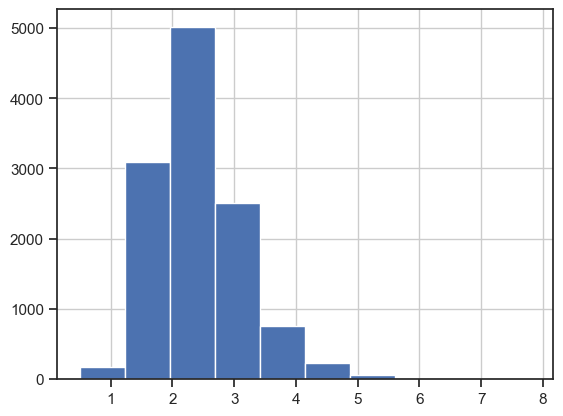

In [119]:
geo_data.magnitude.hist()

In [133]:
# How many earthquakes with magnitude greater than 3 was recorded:
geo_data[geo_data.magnitude > 3].shape[0]

1952

In [134]:
# How many earthquakes with magnitude of 5 or greater occurred:
geo_data[geo_data.magnitude >= 5].shape[0]

47

## Mapping Part

Let's draw a map of Turkey using folium library. We set Turkey's center latitude and longitude as the base map and add a circle mark for each earthquake that has a magnitude greater than 3 by iterating over the rows of the filtered data. Each circle's radius is set to exponent of the magnitude values times a constant for scaling.

In [93]:
#Draw folium map

tr_lat = 38.9597594
tr_lon = 34.9249653

zoom_start = 6
eq_map = folium.Map(location=[tr_lat, tr_lon], zoom_start=zoom_start) 

for row in geo_data[geo_data.magnitude > 3].itertuples():
    folium.CircleMarker([row.latitude, row.longitude], radius=np.exp(0.5*float(row.magnitude)),
        color='#C30303', #if float(row.depth) <=5 else 'orange' if float(row.depth) <10 else 'yellow' if float(row.depth) <20 else 'green',
        popup='Location:{}, Magnitude:{}, Depth:{}'.format(row.location,row.magnitude,row.depth),
        fill=True, fill_color='#C30303' #if float(row.depth) <=5 else 'orange' if float(row.depth) <10 else 'yellow' if float(row.depth) <20 else 'green'
        , fill_opacity=0.3
    ).add_to(eq_map)

eq_map.save("large_map.html")
eq_map

Now draw the same map but also add some colors. The colors represent the depth of each earthquake such that those closer to the ground are colored in red, then orange, then yellow and the deepest one are in green. Also notice the minimap added to the corner.

In [56]:
#Draw folium map
from folium import plugins
minimap = plugins.MiniMap()

tr_lat = 38.9597594
tr_lon = 34.9249653

zoom_start = 7
eq_map = folium.Map(location=[tr_lat, tr_lon], zoom_start=zoom_start) 

for row in geo_data[geo_data.magnitude > 3].itertuples():
    folium.CircleMarker([row.latitude, row.longitude], radius=np.exp(0.5*float(row.magnitude)),
        color='#C30303' if float(row.depth) <=5 else 'orange' if float(row.depth) <10 else 'yellow' if float(row.depth) <20 else 'green',
        popup='Location:{}, Magnitude:{}, Depth:{}'.format(row.location,row.magnitude,row.depth),
        fill=True, fill_color='#C30303' if float(row.depth) <=5 else 'orange' if float(row.depth) <10 else 'yellow' if float(row.depth) <20 else 'green', fill_opacity=0.3
    ).add_to(eq_map)

eq_map.add_child(minimap)
eq_map

Now, lets focus on the earthquake region (South mid-Turkey). And, instead of using exponents of magnitude for the circle size we use powers of 10 to reflect the true size scale of each earthquake.

In [57]:
#Draw folium map
from folium import plugins
minimap = plugins.MiniMap()

kmaras_lat = 37.9773
kmaras_lon = 37.4153

zoom_start = 7
eq_map = folium.Map(location=[kmaras_lat, kmaras_lon], zoom_start=zoom_start) 

# select the earthquakes with larger than 3 magnitude
geo_data_big = geo_data[geo_data.magnitude > 3]

for row in geo_data_big.itertuples():
    folium.CircleMarker([row.latitude, row.longitude], radius=0.000005*(10**float(row.magnitude)), 
        color='#C30303' if float(row.depth) <=5 else 'orange' if float(row.depth) <10 else 'yellow' if float(row.depth) <20 else 'green',
        popup='Location:{}, Magnitude:{}, Depth:{}'.format(row.location,row.magnitude,row.depth),
        fill=True, fill_color='#C30303' if float(row.depth) <=5 else 'orange' if float(row.depth) <10 else 'yellow' if float(row.depth) <20 else 'green', fill_opacity=0.2
    ).add_to(eq_map)

eq_map.add_child(minimap)
eq_map

## Animated Map

Next, we use TimestampedGeoJson plugin from the folium library to add a time animation to our map. To use this functionality we need to save out data in a specificly structured geojson format. The below function `create_geojson_features` does that. Then we apply the `TimestampedGeoJson` function with `period = 'PT1H'` argument which means the animation proceeds with 1 frame per hour over the whole data range. Since the time range is fairly long the animation takes several minutes to finish. We can limit the time range by filtering our data to only quakes occurred between certain dates if we want.

In [58]:
#Draw folium animated map

from folium.plugins import TimestampedGeoJson

kmaras_lat = 37.9773
kmaras_lon = 37.4153

zoom_start = 7
eq_map = folium.Map(location=[kmaras_lat, kmaras_lon], zoom_start=zoom_start) 


def create_geojson_features(df):
    features = []
    
    for _, row in df.iterrows():
        feature = {
            'type': 'Feature',
            'geometry': {
                'type':'Point', 
                'coordinates':[row['longitude'],row['latitude']]
            },
            'properties': {
                'time': row['datetime'].__str__().replace('-','/'),
                'popup' : 'Location:{}, Magnitude:{}, Depth:{}'.format(row.location,row.magnitude,row.depth),
                'style': {'color' : '#C30303' if row['depth'] <=5 else 'orange' if row['depth'] < 10 else 'yellow' if row['depth'] <20 else 'green'},
                'icon': 'circle',
                    'iconstyle':{
                    'fillColor': '#C30303' if row['depth'] <=5 else 'orange' if row['depth'] < 10 else 'yellow' if row['depth'] <20 else 'green',
                    'fillOpacity': 0.2,
                    'stroke': 'true',
                    'radius': np.exp(0.7 * row['magnitude'])
                }
            }
        }
        features.append(feature)
    return features


geojsondata = create_geojson_features(geo_data)

data2 = {'type': 'FeatureCollection', 'features': geojsondata}


TimestampedGeoJson(data2, period = 'PT1H', duration = None,transition_time=300).add_to(eq_map)
eq_map


Below is an example of an animated map using filtered data to a specific date range (Speficically to February 6th, when the two major shocks hit the region).

Also the period is set to 1 frame per 15 minutes.

In [78]:
#Draw folium animated map

from folium.plugins import TimestampedGeoJson

kmaras_lat = 37.9773
kmaras_lon = 37.4153

zoom_start = 7
eq_map = folium.Map(location=[kmaras_lat, kmaras_lon], zoom_start=zoom_start) 

geojsondata = create_geojson_features(geo_data[(geo_data.magnitude > 3) & (geo_data.datetime > '2023-02-06') & (geo_data.datetime < '2023-02-07')])

data3 = {'type': 'FeatureCollection', 'features': geojsondata}

TimestampedGeoJson(data3, period = 'PT15M', duration = None,transition_time=300).add_to(eq_map)
eq_map


## Earthquake Scale Graphs

In this final section we draw plots to compare true size of earthquakes with different magnitudes using the 10-powered rule. In fact, a magnitude 7 earthquake is 10 times larger in size than a 6 magnitude earthquake.

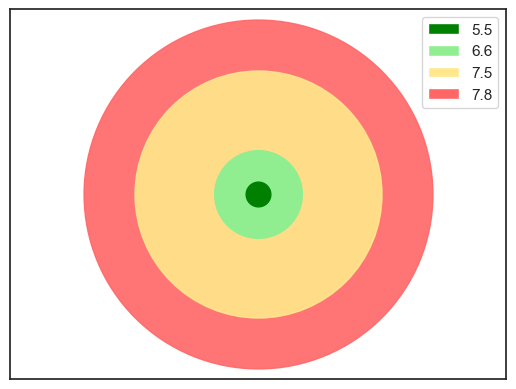

63095.7344480193

In [59]:
import matplotlib.pyplot as plt


# Set the size of the circles based on the logarithmic scale of earthquake magnitudes
circle_size_7p5 = 10**((7.5 - 3)) 
circle_size_7p8 = 10**((7.8 - 3)) 
circle_size_6p6 = 10**((6.6 - 3))
circle_size_5p5 = 10**((5.5 - 3))  

# Plot the circles
plt.scatter([0], [0], s=circle_size_7p8, color='#FF6666', alpha=0.9)
plt.scatter([0], [0], s=circle_size_7p5, color='#FFE88B', alpha=0.9)
plt.scatter([0], [0], s=circle_size_6p6, color='lightgreen', alpha=1)
plt.scatter([0], [0], s=circle_size_5p5, color='green', alpha=1)

# Set the x and y limits to ensure both circles are visible
plt.xlim(-1 * circle_size_7p8, 1 * circle_size_7p8)
plt.ylim(-1 * circle_size_7p8, 1 * circle_size_7p8)

# Add a legend to indicate the magnitude of each circle
plt.legend([plt.Rectangle((0,0), 1,1, fc="green"),
            plt.Rectangle((0,0), 1,1, fc="lightgreen"),
            plt.Rectangle((0,0), 1,1, fc="#FFE88B"),
            plt.Rectangle((0,0), 1,1, fc="#FF6666")],
           ["5.5", "6.6","7.5", "7.8"])

ax = plt.gca()
ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)

# Display the plot
plt.show()
circle_size_7p8


Moreover, energy levels of earthquakes increase by a multiple of 32 (approximately) by each increase in magnitude. In another words a magnitude 7 earthquake is factually 32 times stronger (releases that much more energy) than a magnitude 6. The below plot shows difference of energy released (strengts) by four earthquakes with magnitudes 5.5, 6.6, 7.5, 7.8.

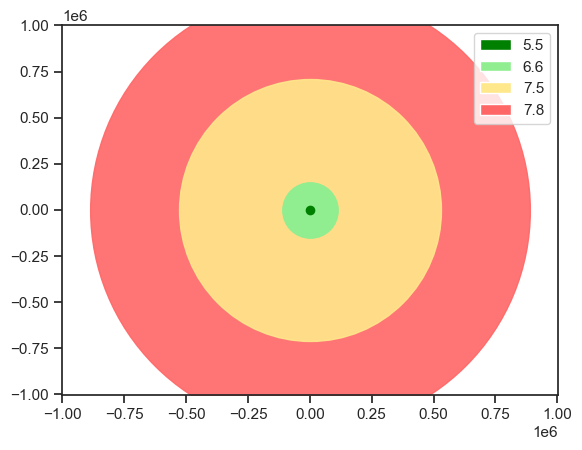

100237.4467254543

In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Set the size of the circles based on the logarithmic scale of earthquake magnitudes
circle_size_7p5 = 0.0000002*10 ** (1.5 * 7.5 )
circle_size_7p8 = 0.0000002*10 ** (1.5 * 7.8 )
circle_size_6p6 = 0.0000002*10 ** (1.5 * 6.6 )
circle_size_5p5 = 0.0000002*10 ** (1.5 * 5.5 )

# Plot the circles
plt.scatter([0], [0], s=circle_size_7p8, color='#FF6666', alpha=0.9)
plt.scatter([0], [0], s=circle_size_7p5, color='#FFE88B', alpha=0.9)
plt.scatter([0], [0], s=circle_size_6p6, color='lightgreen', alpha=1)
plt.scatter([0], [0], s=circle_size_5p5, color='green', alpha=1)

# Set the x and y limits to ensure both circles are visible
#plt.xlim(-1e19, 1e19)
#plt.ylim(-1e19, 1e19)

plt.xlim(-10 * circle_size_7p8, 10 * circle_size_7p8)
plt.ylim(-10 * circle_size_7p8, 10 * circle_size_7p8)

# Add a legend to indicate the magnitude of each circle
plt.legend([plt.Rectangle((0,0), 1,1, fc="green"),
            plt.Rectangle((0,0), 1,1, fc="lightgreen"),
            plt.Rectangle((0,0), 1,1, fc="#FFE88B"),
            plt.Rectangle((0,0), 1,1, fc="#FF6666")],
           ["5.5", "6.6","7.5", "7.8"])

# Display the plot
plt.show()
circle_size_7p8

## Bargraph of earthquakes on a timeline

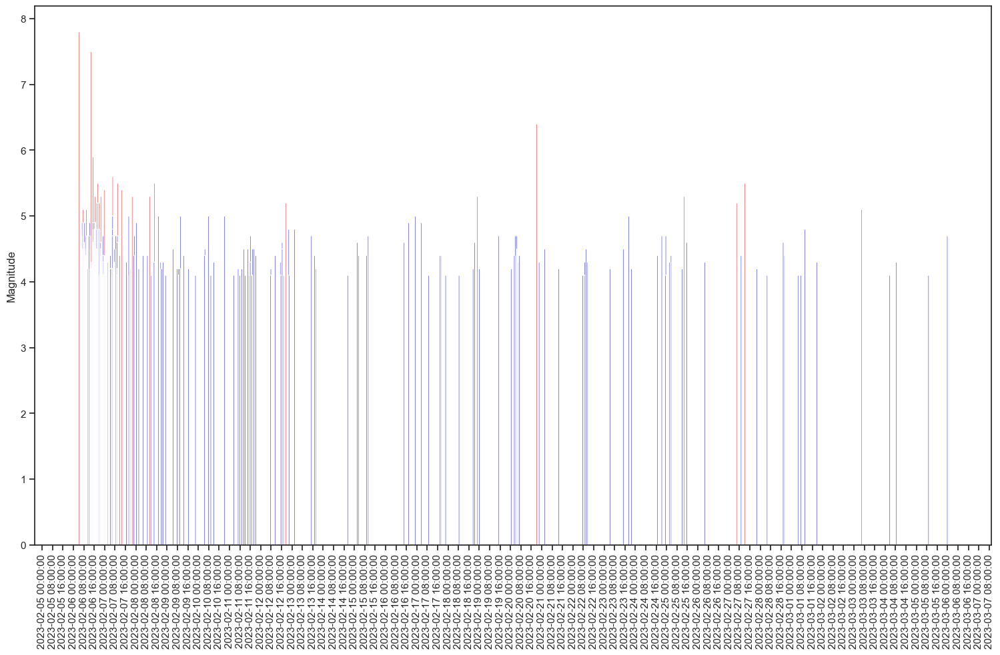

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Sort the data by date
df = geo_data[geo_data.magnitude > 4]#.sort_values(by='datetime')

# Create a bar plot
plt.bar(df['datetime'], df['magnitude'], color= df['magnitude'].apply(lambda x: 'red' if  x>5 else 'blue'), width=0.04, snap=False)

# Set the x-axis labels to be the dates in the data
plt.xticks(df['datetime'], rotation=90)

# Set the x-axis label format to show dates
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M:%S'))

# Set the x-axis label interval to 4 hours
plt.gca().xaxis.set_major_locator(mdates.HourLocator(byhour=range(0, 24, 8)))

# Label the y-axis
plt.ylabel('Magnitude')
#plt.ylim(0, max(df['magnitude'])*1.01)

#plt.set_size_inches(11,8.5)

#plt.figure(figsize=(18, 11), dpi=200)
#plt.figure(figsize=(18, 11), dpi=200)
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
fig.savefig('deprembar.png', dpi=100)

# Show the plot
plt.show()
